## Main where we fit over the 30 years matrix and then we see where the points of the 15years are associated (counts)

In [ ]:
import sys
import os
sys.path.append(os.path.abspath(".."))

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import gc
import matplotlib.pyplot as plt
import shapefile as shp
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import importlib
import utils.data_processing
import utils.visualization
importlib.reload(utils.data_processing)
importlib.reload(utils.visualization)

# Import the functions 
from utils.data_processing import prepare_data_matrix, apply_global_standardization, perform_incremental_pca

from utils.visualization import plot_variance, scatter_plot_2d,scatter_plot_3d,  add_country_boundaries
from utils.visualization import visualization_pca_coefficient

from utils.clusterization import kmeans, elbow_analysis, gap_statistic, silhouette_analysis, davies_bouldin_analysis

The upload of the files, the normalization of the data and the pca are already perfomed and all the results are saved into the matrix _X_pca_30y.npy_.   
Other useful quantities saved in this folder are:   
_global_mean_30y.npy_  
_global_std_30y.npy_  
_ipca_30y.plk_  

All of those quantities were obtained in the jupyter notebook: application_to_15y.ipynb. It uses the code prsente the jupyter notebook creazione_matrice.ipynb and uploading first the file era5_1994_2008.grib and the the file era5_2009_2023.grib

The results of this notebook are saved in the word: Risultati_30y_12mesi.docx

In [2]:
# 30y
X_pca = np.load("X_pca_30y.npy")
print(X_pca.shape)

(10957, 20)


In [3]:
k_max = int(np.sqrt(X_pca.shape[0] / 2))
K_range = range(2,50 + 1)  

# Perform kmeans
results = kmeans(X_pca, K_range=K_range, n_init=20)

labels_6 = results["labels"][6]
labels_10 = results["labels"][10]
labels_11 = results["labels"][11]

pd.Series(labels_6).to_csv("/home/eugenia/Arpav/progetto/RES_k_era5_2004_2013/labels_k6.csv", index=False, header=False)
pd.Series(labels_10).to_csv("/home/eugenia/Arpav/progetto/RES_k_era5_2004_2013/labels_k10.csv", index=False, header=False)
pd.Series(labels_11).to_csv("/home/eugenia/Arpav/progetto/RES_k_era5_2004_2013/labels_k11.csv", index=False, header=False)


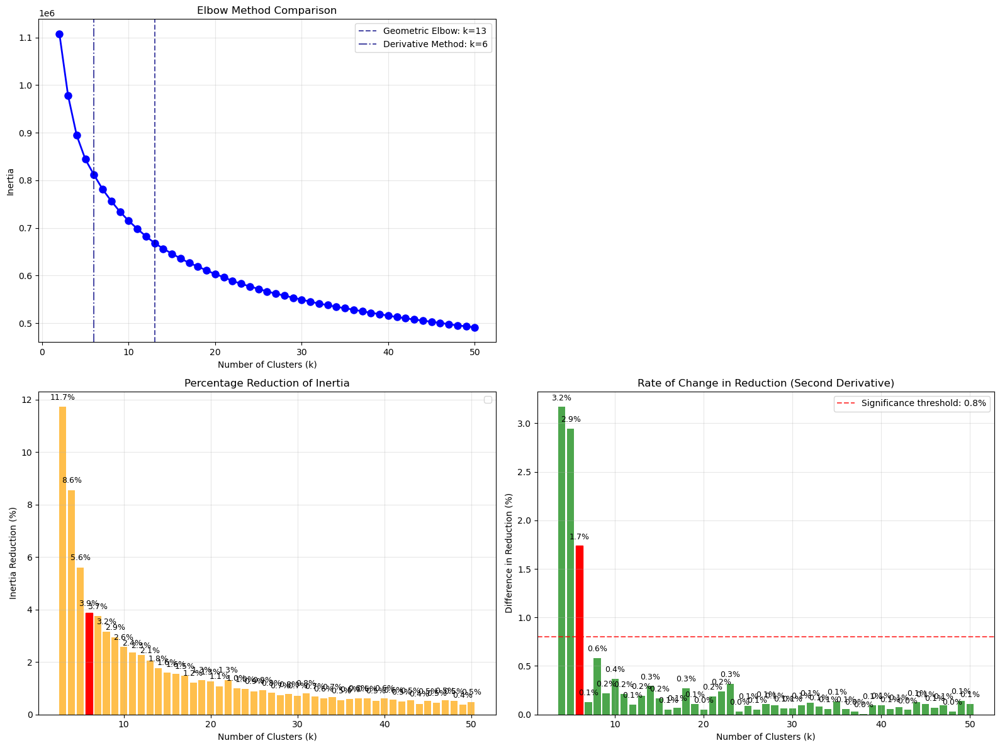

Elbow method suggests k = 13
Derivative method suggests k = 6


In [4]:
# ELBOW METHOD WITH PERCENTAGE REDUCTION

# Perform elbow analysis
k_elbow, k_derivative, reductions, _ = elbow_analysis(results) 
print(f"Elbow method suggests k = {k_elbow}")
print(f"Derivative method suggests k = {k_derivative}")


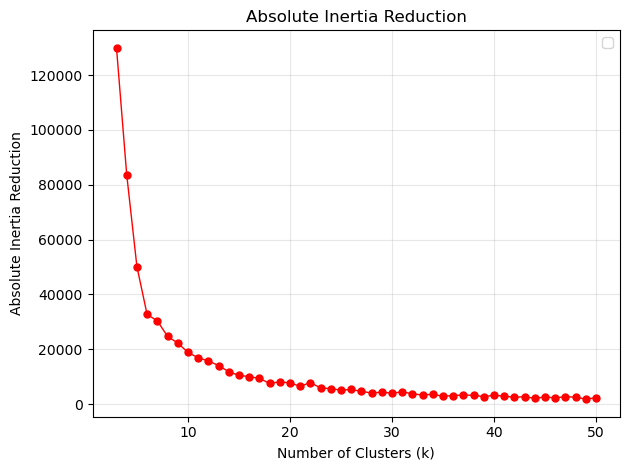

In [5]:
#### prova per vedere la differenza assoluta dell'inerzia vs k
def plot_absolute_inertia_reduction(results):
    """
    Visualizza la riduzione ASSOLUTA dell'inerzia
    """

    # Estraggo dati dai risultati
    K_range = results["K_range"]
    inertias = results["inertia"] 
    
    # Calcola le differenze ASSOLUTE
    absolute_reductions = []
    for i in range(1, len(inertias)):
        absolute_diff = inertias[i-1] - inertias[i]  # Quanto si riduce in valore assoluto
        absolute_reductions.append(absolute_diff)

    # Plot 1: DIFFERENZE ASSOLUTE 
    k_reductions = list(K_range)[1:]  # k da 3 in poi (perché confronto k vs k-1)

    plt.plot(k_reductions, absolute_reductions, 'ro-', linewidth=1, markersize=5)
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Absolute Inertia Reduction')
    plt.title('Absolute Inertia Reduction')
    plt.grid(True, alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()

# Use
plot_absolute_inertia_reduction(results)

In [6]:
# GAP STATISTIC ANALYSIS

# Run the analysis 
##k_optimal, gap_values, error_values = gap_statistic(X_pca, results["K_range"], results)
##print(f"Optimal number of clusters: k = {k_optimal}")

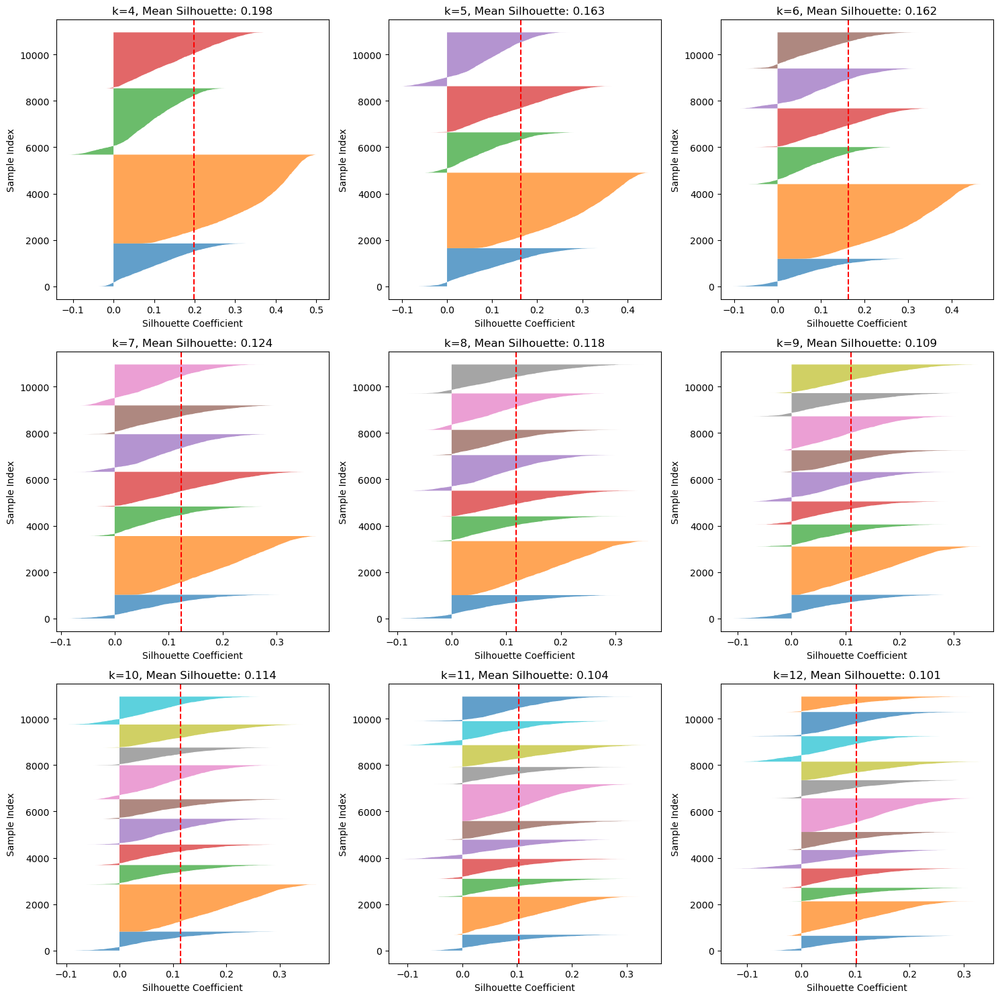

Silhouette Scores:
k=4: 0.198
k=5: 0.163
k=6: 0.162
k=7: 0.124
k=8: 0.118
k=9: 0.109
k=10: 0.114
k=11: 0.104
k=12: 0.101


In [7]:
# SILHOUETTE ANALYSIS FOR CANDIDATE K VALUES

# Run silhouette analysis 
k_candidates = [ 4, 5, 6, 7, 8, 9, 10, 11, 12] 
silhouette_results = silhouette_analysis(X_pca, k_candidates)

print("Silhouette Scores:")
for k, score in zip(k_candidates, silhouette_results):
    print(f"k={k}: {score:.3f}")

Best value for k=4 (DB = 1.817)


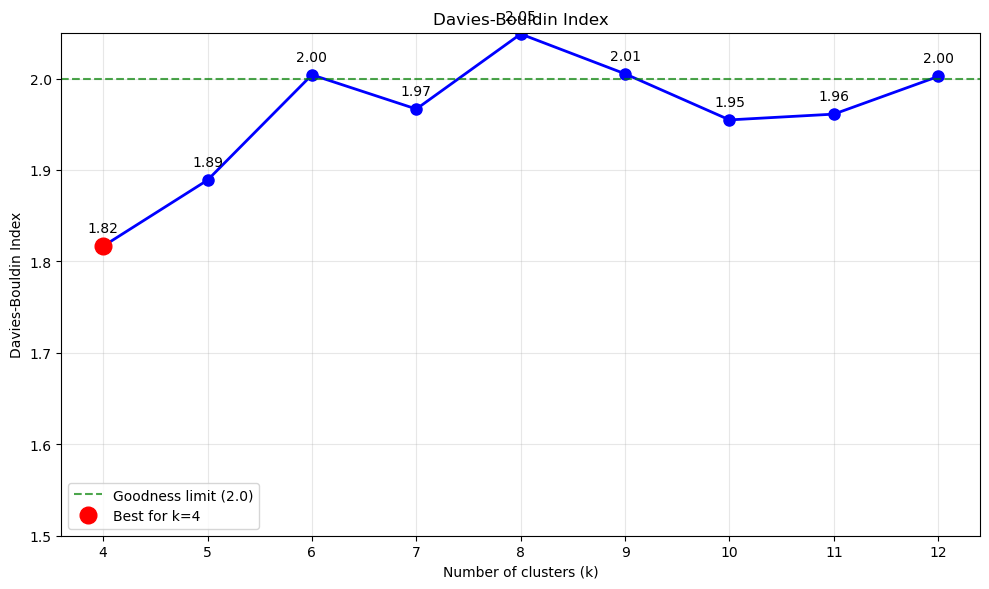


SILHOUETTE vs DAVIES-BOULDIN:
k=4: Silhouette=0.198, Davies-Bouldin=1.817
k=5: Silhouette=0.163, Davies-Bouldin=1.889
k=6: Silhouette=0.162, Davies-Bouldin=2.004
k=7: Silhouette=0.124, Davies-Bouldin=1.967
k=8: Silhouette=0.118, Davies-Bouldin=2.049
k=9: Silhouette=0.109, Davies-Bouldin=2.005
k=10: Silhouette=0.114, Davies-Bouldin=1.955
k=11: Silhouette=0.104, Davies-Bouldin=1.961
k=12: Silhouette=0.101, Davies-Bouldin=2.002


In [8]:
db_scores = davies_bouldin_analysis(X_pca, k_candidates, results)

# Confront with Silhouette
print("\nSILHOUETTE vs DAVIES-BOULDIN:")
for i, k in enumerate(k_candidates):
    if i < len(silhouette_results) and i < len(db_scores):
        print(f"k={k}: Silhouette={silhouette_results[i]:.3f}, "
              f"Davies-Bouldin={db_scores[i]:.3f}")

### Clustering Analysis

In [9]:
# Analyze final clustering results
k_final = 6
final_labels= results["labels"][k_final]
final_centroids = results["centroids"][k_final]
print (f"Final centroids shape {final_centroids.shape}")


Final centroids shape (6, 20)


In [10]:
# 30y
import joblib
del X_pca
gc.collect()

46044

In [11]:
# 30y
ds = xr.open_dataset('../era5_1994_2023.grib', engine='cfgrib')

# Create a new dataset
ds_filtered = xr.Dataset()

# Add the geopotential at 500 hPa
z_500 = ds['z'].sel(isobaricInhPa=[500])

# Add the temperature at 850 hPa
t_850 = ds['t'].sel(isobaricInhPa=[850])

# Rename the coordinates in order to avoid conflicts
z_500 = z_500.rename({'isobaricInhPa': 'pressure_z'})
t_850 = t_850.rename({'isobaricInhPa': 'pressure_t'})


# Combine everything into the filtered dataset
ds_filtered = xr.Dataset({
    'z': z_500,
    't': t_850
})

Ignoring index file '../era5_1994_2023.grib.5b7b6.idx' incompatible with GRIB file


In [12]:
sf = shp.Reader("../world/world-administrative-boundaries.shp")
# Get dimensions from original dataset (ds), not from X_pca which is a numpy array
n_lat = ds.dims['latitude'] if 'latitude' in ds.dims else len(ds.latitude)
n_lon = ds.dims['longitude'] if 'longitude' in ds.dims else len(ds.longitude)
n_pressure = ds.dims['isobaricInhPa'] if 'isobaricInhPa' in ds.dims else len(ds.isobaricInhPa)

lats = ds.latitude.values
lons = ds.longitude.values
pressure_levels = ds.isobaricInhPa.values.tolist()

In [13]:
# 30y 
del ds
gc.collect()

ipca = joblib.load("ipca_30y.pkl")
global_mean = np.load("global_mean_30y.npy")
global_std  = np.load("global_std_30y.npy")


In [14]:
# Reconstruct meteorological patterns from PCA centroids


def reconstruct_physical_patterns(centroids, ipca, global_mean, global_std, 
                                 ds_filtered):
    """  
    Reconstruct the meteorological patterns from PCA centroids
    """
    # Step 1 : Inverse PCA
    print(f"Input centroids shape: {centroids.shape}")
    centroids_original_space = ipca.inverse_transform(centroids)
    print(f"IPCA inverted: {centroids_original_space.shape}")

    # Step 2 : Destandardization to reobtain the physical values
    centroids_physical = centroids_original_space * global_std + global_mean
    print(f"Destandardized values: {centroids_physical.shape}")
    

    # Step 3 : Reshape for each cluster
    n_lat = ds_filtered.dims['latitude']
    n_lon = ds_filtered.dims['longitude']
    spatial_size= n_lat * n_lon
    print(f"Spatial dimensions: {n_lat} lat x {n_lon} lon = {spatial_size} points")

    # Step 4 : reconstruct each cluster pattern
    cluster_patterns = {}

    for cluster_id in range(len(centroids_physical)):
        pattern_vector = centroids_physical[cluster_id] # (129042,)
        patterns = {}

        # Extract z (geopotential at 500 hPa)
        z_values = pattern_vector[:spatial_size]   # First 64521 values
        z_map = z_values.reshape(n_lat, n_lon)
        patterns['z'] = z_map

        # Extract t (temperature at 850 hPa)
        t_values = pattern_vector[spatial_size: 2 * spatial_size]  # Next 64521 values
        t_map = t_values.reshape(n_lat, n_lon)
        patterns['t'] = t_map

        cluster_patterns[cluster_id] = patterns
        print(f"Cluster {cluster_id}: Z {z_map.shape} - Range [{z_map.min():.1f}, {z_map.max():.1f}]")
        print(f"Cluster {cluster_id}: T {t_map.shape} - Range [{t_map.min():.1f}, {t_map.max():.1f}]")

    return cluster_patterns

# ESEGUI LA RICOSTRUZIONE
cluster_patterns = reconstruct_physical_patterns(final_centroids, ipca, global_mean, global_std, ds_filtered)

Input centroids shape: (6, 20)
IPCA inverted: (6, 129042)
Destandardized values: (6, 129042)
Spatial dimensions: 201 lat x 321 lon = 64521 points
Cluster 0: Z (201, 321) - Range [49809.4, 57325.6]
Cluster 0: T (201, 321) - Range [254.4, 291.2]
Cluster 1: Z (201, 321) - Range [51301.3, 57432.6]
Cluster 1: T (201, 321) - Range [260.7, 294.5]
Cluster 2: Z (201, 321) - Range [53922.7, 58124.4]
Cluster 2: T (201, 321) - Range [271.6, 303.0]
Cluster 3: Z (201, 321) - Range [50727.7, 57391.8]
Cluster 3: T (201, 321) - Range [260.2, 294.3]
Cluster 4: Z (201, 321) - Range [52676.0, 57782.8]
Cluster 4: T (201, 321) - Range [265.4, 298.6]
Cluster 5: Z (201, 321) - Range [50999.2, 57405.2]
Cluster 5: T (201, 321) - Range [256.8, 291.9]


MAPPE METEOROLOGICHE DEI CLUSTER
CLUSTER 0:


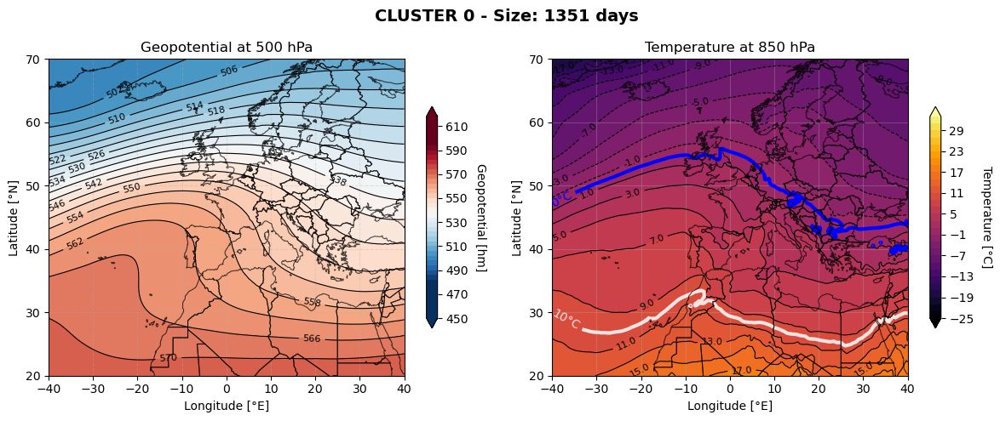


 STATISTICHE CLUSTER: 0
Geopotenziale 500 hPa:
   • Media: 544 hm
   • Range: 498 - 573 hm
   • Variabilità: 22 hm
Temperatura 850 hPa:
   • Media: 275.4 K (2.2°C)
   • Range: -18.8 - 18.0 K
   • Variabilità: 7.5 K
CLUSTER 1:


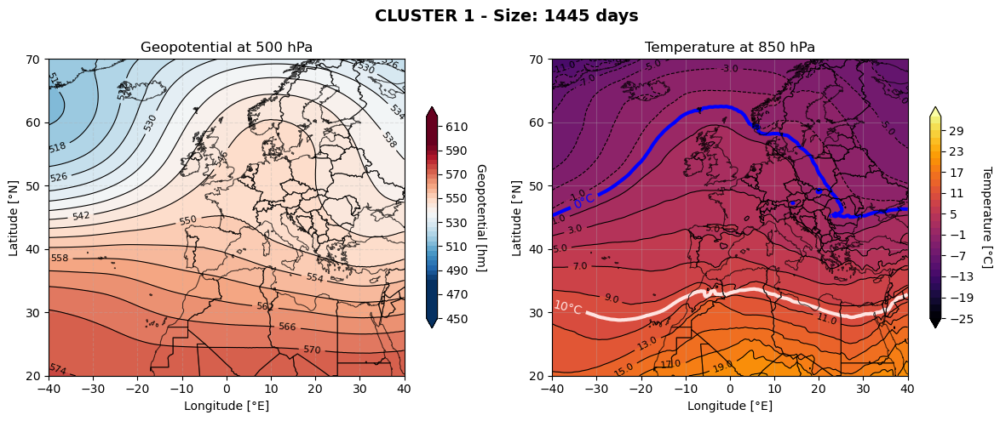


 STATISTICHE CLUSTER: 1
Geopotenziale 500 hPa:
   • Media: 549 hm
   • Range: 513 - 574 hm
   • Variabilità: 15 hm
Temperatura 850 hPa:
   • Media: 277.2 K (4.0°C)
   • Range: -12.4 - 21.3 K
   • Variabilità: 7.0 K
CLUSTER 2:


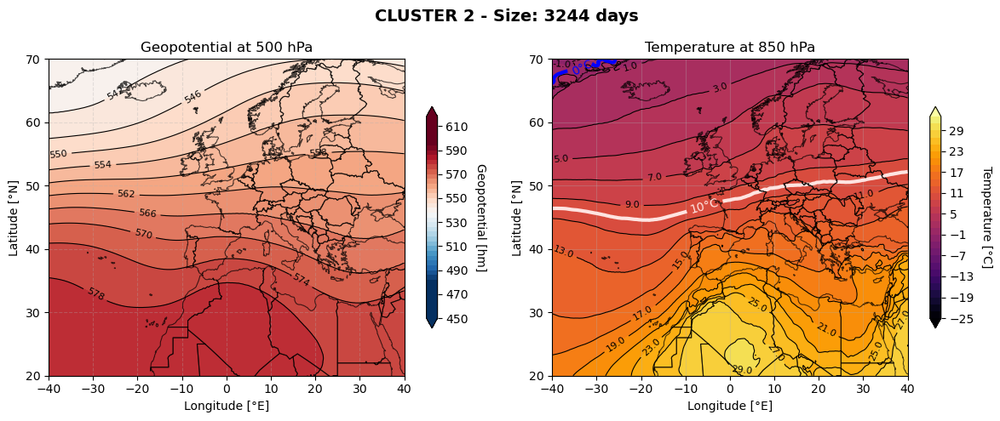


 STATISTICHE CLUSTER: 2
Geopotenziale 500 hPa:
   • Media: 564 hm
   • Range: 539 - 581 hm
   • Variabilità: 13 hm
Temperatura 850 hPa:
   • Media: 285.8 K (12.6°C)
   • Range: -1.5 - 29.8 K
   • Variabilità: 7.9 K
CLUSTER 3:


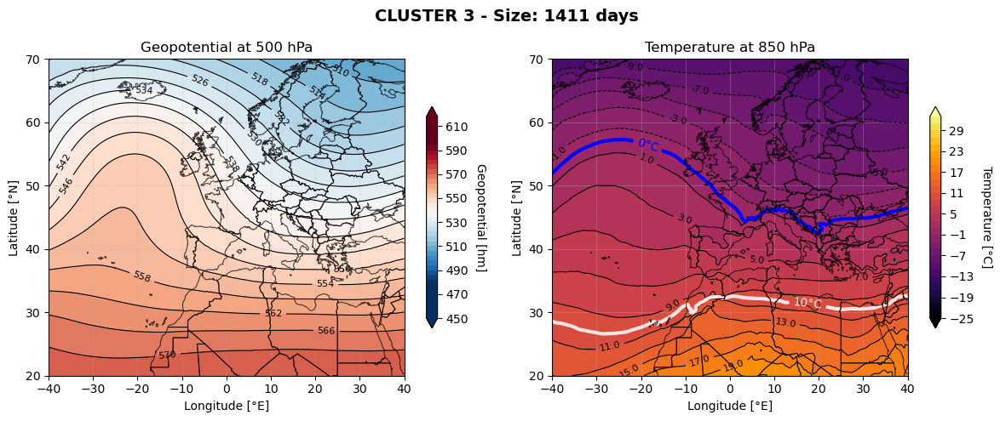


 STATISTICHE CLUSTER: 3
Geopotenziale 500 hPa:
   • Media: 546 hm
   • Range: 507 - 574 hm
   • Variabilità: 17 hm
Temperatura 850 hPa:
   • Media: 275.6 K (2.5°C)
   • Range: -12.9 - 21.2 K
   • Variabilità: 8.2 K
CLUSTER 4:


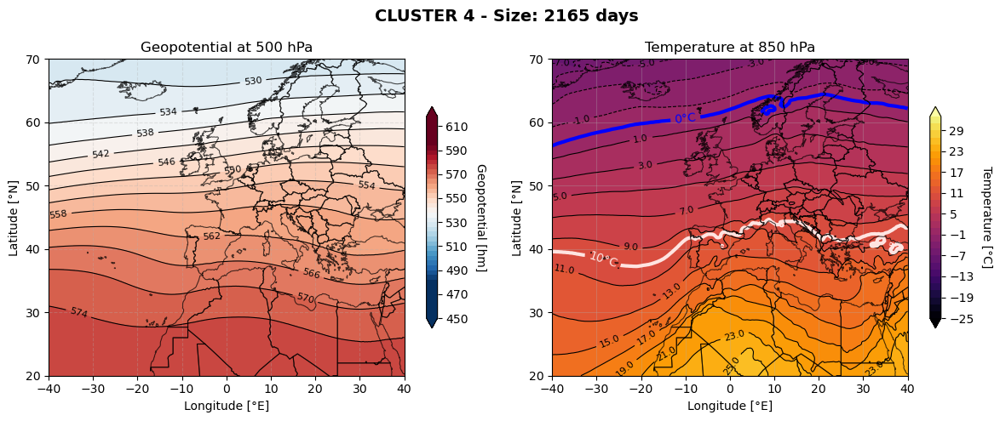


 STATISTICHE CLUSTER: 4
Geopotenziale 500 hPa:
   • Media: 556 hm
   • Range: 527 - 578 hm
   • Variabilità: 16 hm
Temperatura 850 hPa:
   • Media: 281.7 K (8.5°C)
   • Range: -7.7 - 25.5 K
   • Variabilità: 8.0 K
CLUSTER 5:


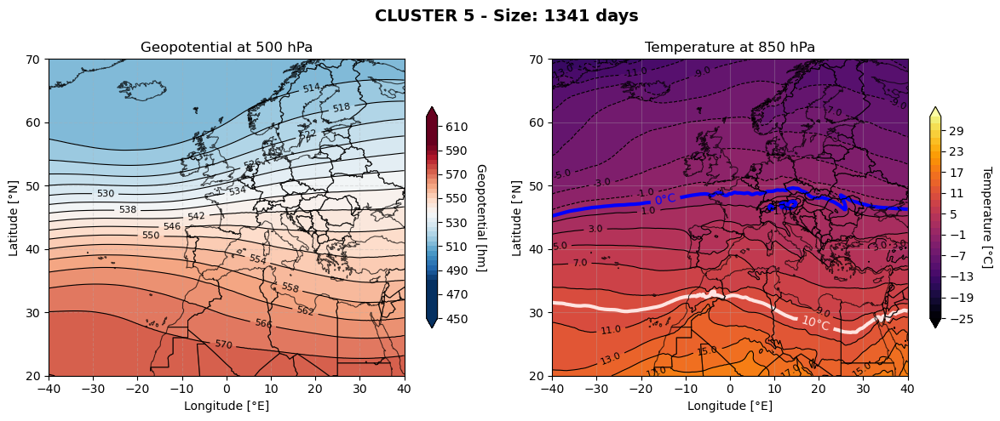


 STATISTICHE CLUSTER: 5
Geopotenziale 500 hPa:
   • Media: 541 hm
   • Range: 510 - 574 hm
   • Variabilità: 22 hm
Temperatura 850 hPa:
   • Media: 275.1 K (2.0°C)
   • Range: -16.4 - 18.7 K
   • Variabilità: 8.1 K


In [15]:
# tengo
# Visualization

def plot_cluster_meteorological_maps(cluster_patterns, lats, lons, sf=None):
    """
    Visualizza le mappe meteorologiche 
    """
    # Fixed levels for geopotential
    z_levels_fixed = np.arange(450, 620, 4)  
    z_vmin, z_vmax = 480, 595

    # Fixed levels for temperature
    t_levels_fixed = np.arange(-25, 35, 2)  
    t_vmin, t_vmax = -25, 35
    
    for cluster_id, pattern in cluster_patterns.items():
        # Compute the number of elements in the cluster
        cluster_size = np.sum(final_labels == cluster_id)
        print(f"CLUSTER {cluster_id}:")
        
        # Create the plots
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        lon_grid, lat_grid = np.meshgrid(lons, lats)
        
        # PLOT GEOPOTENZIALE (Z)
        ax = axes[0]
        z_data = pattern['z']  # Shape: (201, 321)
        z_data_hm = z_data / 100 # Convert in hm

        #z_levels = np.linspace(z_data_hm.min(), z_data_hm.max(), 20)
        contour_z = ax.contourf(lon_grid, lat_grid, z_data_hm,
                               levels=z_levels_fixed, cmap='RdBu_r',vmin=z_vmin, vmax=z_vmax, extend='both')

        contour_lines_z = ax.contour(lon_grid, lat_grid, z_data_hm,
                                    levels=z_levels_fixed, colors='black', linewidths=0.8)
        ax.clabel(contour_lines_z, inline=True, fontsize=8, fmt='%.0f')

        # Confini europei
        if sf is not None:
            add_country_boundaries(ax, sf)
                
        # Styling
        ax.set_title(f'Geopotential at 500 hPa')
        ax.set_xlabel('Longitude [°E]')
        ax.set_ylabel('Latitude [°N]')
        ax.set_xlim([lons.min(), lons.max()])
        ax.set_ylim([lats.min(), lats.max()])
        ax.grid(True, alpha=0.3, linestyle='--')
                
        # Colorbar
        cbar_z = plt.colorbar(contour_z, ax=ax, shrink=0.7)
        cbar_z.set_label('Geopotential [hm]', rotation=270, labelpad=15)
        
        # PLOT TEMPERATURA (T)
        ax = axes[1]
        t_data = pattern['t']  # Shape: (201, 321)
        t_data_celsius = t_data - 273.15
        
        # Contour plot per temperatura
        #t_levels = np.linspace(t_data_celsius.min(), t_data_celsius.max(), 20)
        contour_t = ax.contourf(lon_grid, lat_grid, t_data_celsius, 
                               levels=t_levels_fixed, cmap='inferno', extend='both', vmin= t_vmin, vmax=t_vmax)

        # Linee di contorno
        contour_lines_t = ax.contour(lon_grid, lat_grid, t_data_celsius, 
                                    levels=t_levels_fixed, colors='black', linewidths=0.8)
        ax.clabel(contour_lines_t, inline=True, fontsize=8, fmt='%.1f')

        zero_contour = ax.contour(lon_grid, lat_grid, t_data_celsius, 
                                 levels=[0], colors='blue', 
                                 linewidths=3, linestyles='-')
        ax.clabel(zero_contour, inline=True, fontsize=10, fmt='0°C', colors='blue')

        ten_contour = ax.contour(lon_grid, lat_grid, t_data_celsius, 
                                 levels=[10], colors='mistyrose', 
                                 linewidths=3, linestyles='-')
        ax.clabel(ten_contour, inline=True, fontsize=10, fmt='10°C', colors='mistyrose')

        # Confini europei
        if sf is not None:
            add_country_boundaries(ax, sf)
        
        # Styling
        ax.set_title('Temperature at 850 hPa')
        ax.set_xlabel('Longitude [°E]')
        ax.set_ylabel('Latitude [°N]')
        ax.set_xlim([lons.min(), lons.max()])
        ax.set_ylim([lats.min(), lats.max()])
        ax.grid(True, alpha=0.3)
        
        # Colorbar
        cbar_t = plt.colorbar(contour_t, ax=ax, shrink=0.7)
        cbar_t.set_label('Temperature [°C]', rotation=270, labelpad=15)
        
        # Titolo generale
        fig.suptitle(f'CLUSTER {cluster_id} - Size: {cluster_size} days', 
                    fontsize=14, fontweight='bold')
        
        plt.tight_layout()
        plt.show()

        print_cluster_stats(cluster_id, pattern)

def print_cluster_stats(cluster_id, pattern):
    """
    Stampa statistiche semplici per il cluster
    """
    print(f"\n STATISTICHE CLUSTER: {cluster_id}")
    
    # Geopotenziale
    z_data = pattern['z']
    z_data_hm = z_data / 100
    print(f"Geopotenziale 500 hPa:")
    print(f"   • Media: {z_data_hm.mean():.0f} hm")
    print(f"   • Range: {z_data_hm.min():.0f} - {z_data_hm.max():.0f} hm")
    print(f"   • Variabilità: {z_data_hm.std():.0f} hm")

    # Temperatura
    t_data = pattern['t']
    t_data_celsius = t_data - 273.15
    print(f"Temperatura 850 hPa:")
    print(f"   • Media: {t_data.mean():.1f} K ({t_data_celsius.mean():.1f}°C)")
    print(f"   • Range: {t_data_celsius.min():.1f} - {t_data_celsius.max():.1f} K")
    print(f"   • Variabilità: {t_data_celsius.std():.1f} K")

#  ESECUZIONE SEMPLIFICATA
print("MAPPE METEOROLOGICHE DEI CLUSTER")


plot_cluster_meteorological_maps(cluster_patterns, lats, lons, sf)


In [16]:
def find_most_representative_days(cluster_id, final_labels, final_centroids, X_pca, n_days = 1):
    """
    Trova il giorno più rappresentativo (più vicino al centroide) per un cluster

    """
    # Trova tutti i giorni appartenenti al cluster
    cluster_mask = final_labels == cluster_id
    cluster_points = X_pca[cluster_mask]
    centroid = final_centroids[cluster_id]
    
    # Calcola distanze euclidee dal centroide
    distances = np.linalg.norm(cluster_points - centroid, axis=1)
    
    # Trova l'indice del punto più vicino (distanza minima)
    closest_idx_in_cluster = np.argsort(distances)[:n_days]
    
    # Trova l'indice originale nel dataset completo
    original_indices = np.where(cluster_mask)[0]
    most_representative_day_idx = original_indices[closest_idx_in_cluster]
    
    return most_representative_day_idx, distances[closest_idx_in_cluster]

In [17]:
#load X_pca
X_pca = np.load("X_pca_30y.npy")

ANALISI DEI TOP 3 GIORNI PIÙ RAPPRESENTATIVI
TOP 3 GIORNI PIÙ RAPPRESENTATIVI PER CLUSTER

Cluster 0 (1351 giorni):
  1. 2012-02-22 - Distanza: 5.194 - Rappresentatività: 42.8%
  2. 2018-02-17 - Distanza: 5.230 - Rappresentatività: 42.4%
  3. 1994-03-28 - Distanza: 5.394 - Rappresentatività: 40.6%

Cluster 1 (1445 giorni):
  1. 2002-04-18 - Distanza: 4.411 - Rappresentatività: 52.1%
  2. 1996-04-09 - Distanza: 4.484 - Rappresentatività: 51.4%
  3. 1996-04-06 - Distanza: 4.770 - Rappresentatività: 48.2%

Cluster 2 (3244 giorni):
  1. 1999-07-20 - Distanza: 3.083 - Rappresentatività: 55.8%
  2. 2003-07-05 - Distanza: 3.208 - Rappresentatività: 54.0%
  3. 1997-07-27 - Distanza: 3.411 - Rappresentatività: 51.1%

Cluster 3 (1411 giorni):
  1. 1997-12-04 - Distanza: 5.195 - Rappresentatività: 45.8%
  2. 1998-11-15 - Distanza: 5.206 - Rappresentatività: 45.7%
  3. 1997-04-21 - Distanza: 5.367 - Rappresentatività: 44.0%

Cluster 4 (2165 giorni):
  1. 2005-06-03 - Distanza: 3.115 - Rappresentat

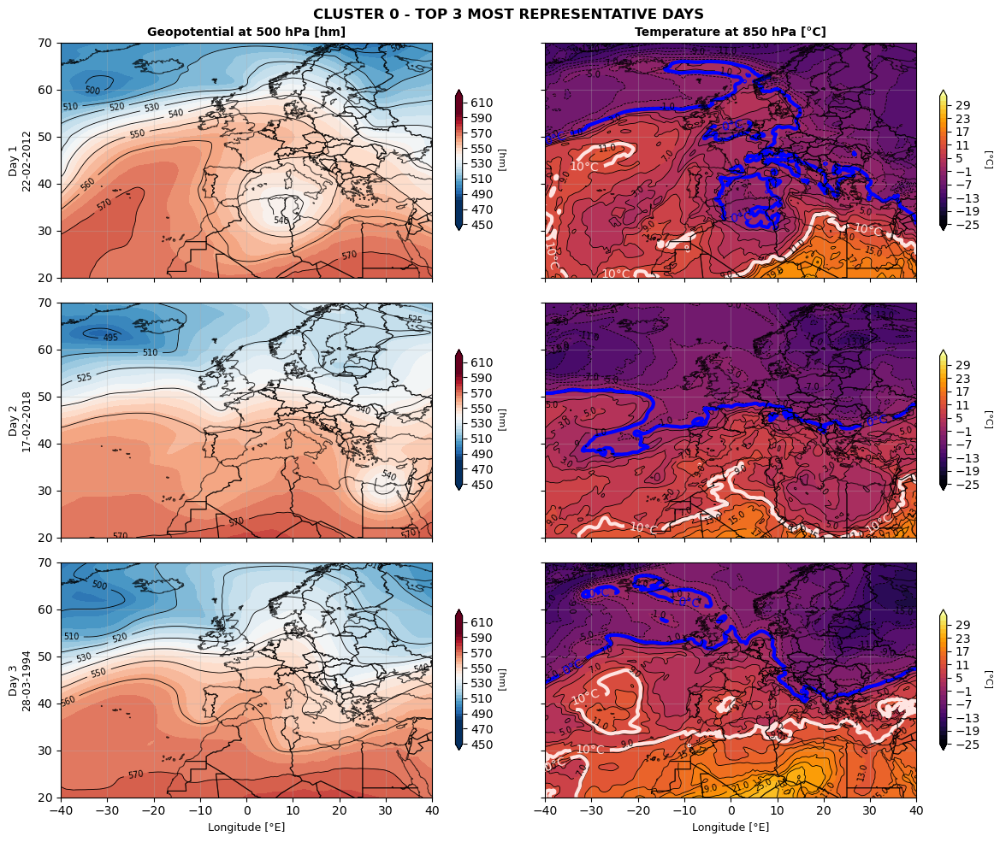

CLUSTER 1 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 18-04-2002 (Thursday) - Rappresentatività: 52.1%
  2. 09-04-1996 (Tuesday) - Rappresentatività: 51.4%
  3. 06-04-1996 (Saturday) - Rappresentatività: 48.2%


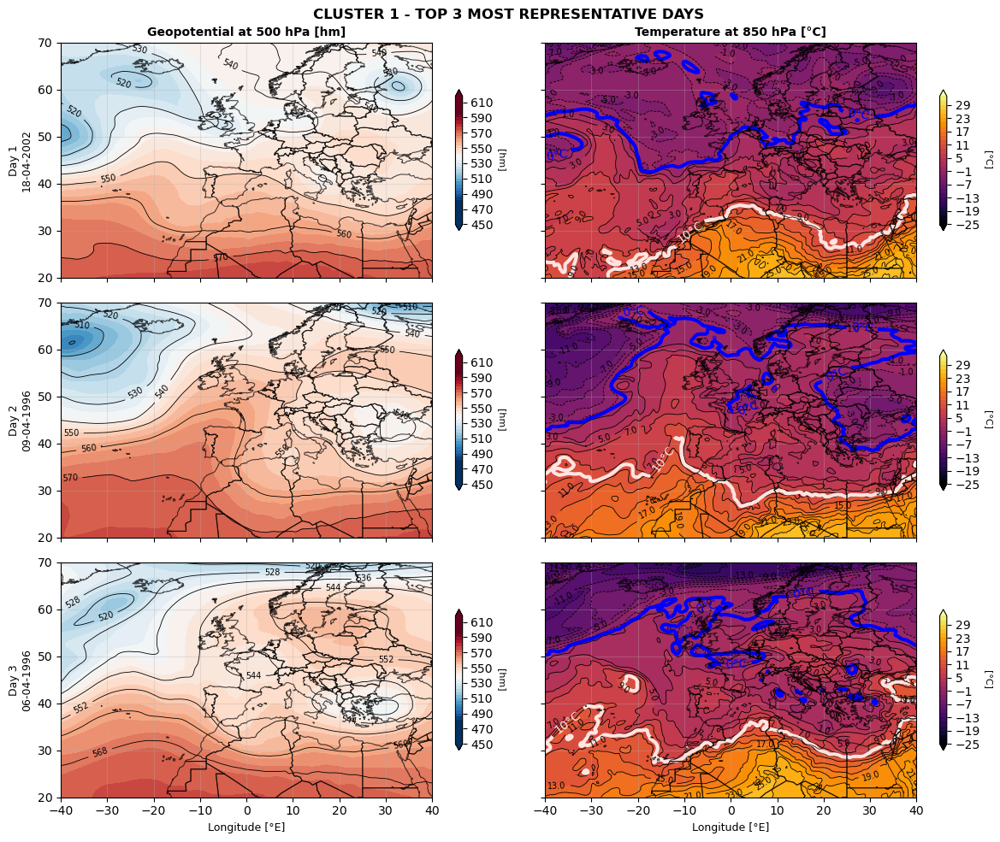

CLUSTER 2 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 20-07-1999 (Tuesday) - Rappresentatività: 55.8%
  2. 05-07-2003 (Saturday) - Rappresentatività: 54.0%
  3. 27-07-1997 (Sunday) - Rappresentatività: 51.1%


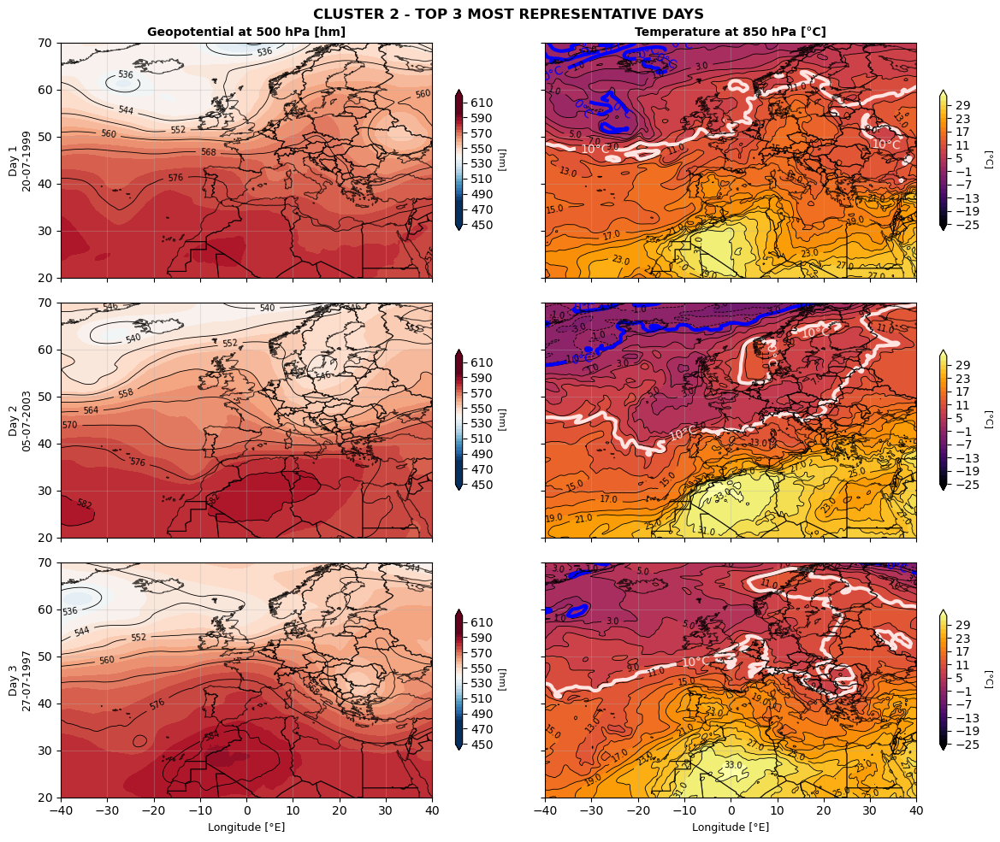

CLUSTER 3 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 04-12-1997 (Thursday) - Rappresentatività: 45.8%
  2. 15-11-1998 (Sunday) - Rappresentatività: 45.7%
  3. 21-04-1997 (Monday) - Rappresentatività: 44.0%


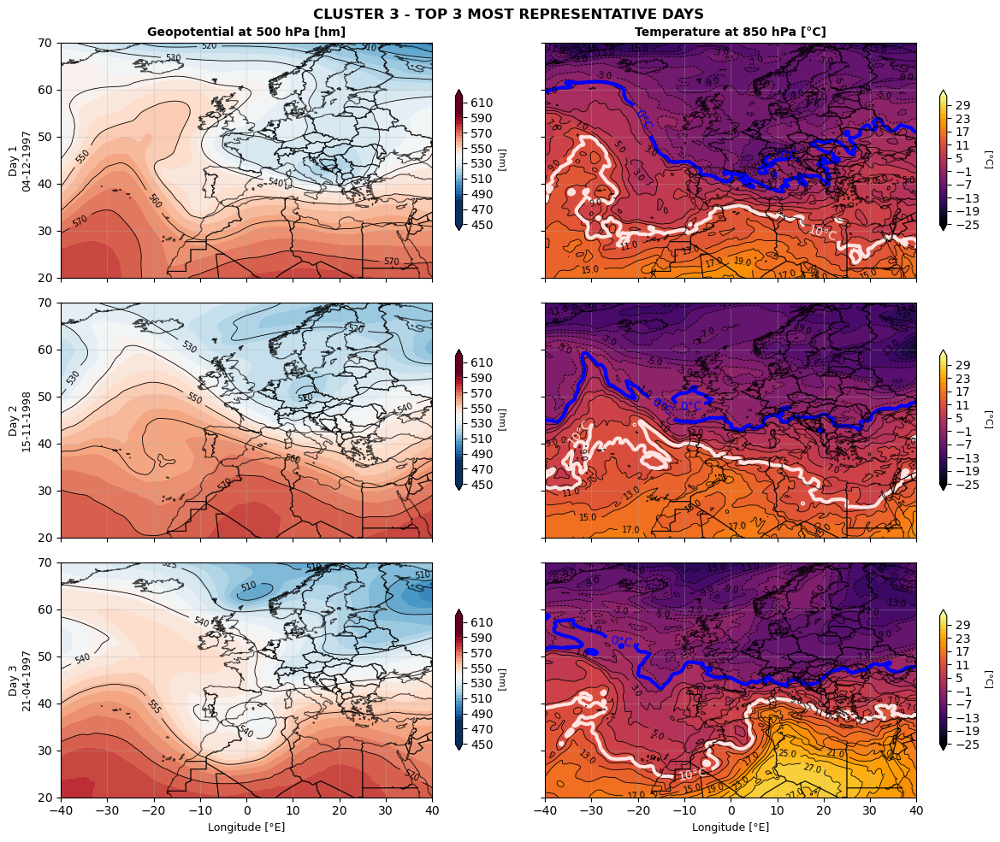

CLUSTER 4 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 03-06-2005 (Friday) - Rappresentatività: 62.8%
  2. 04-06-2005 (Saturday) - Rappresentatività: 60.0%
  3. 20-09-2010 (Monday) - Rappresentatività: 54.8%


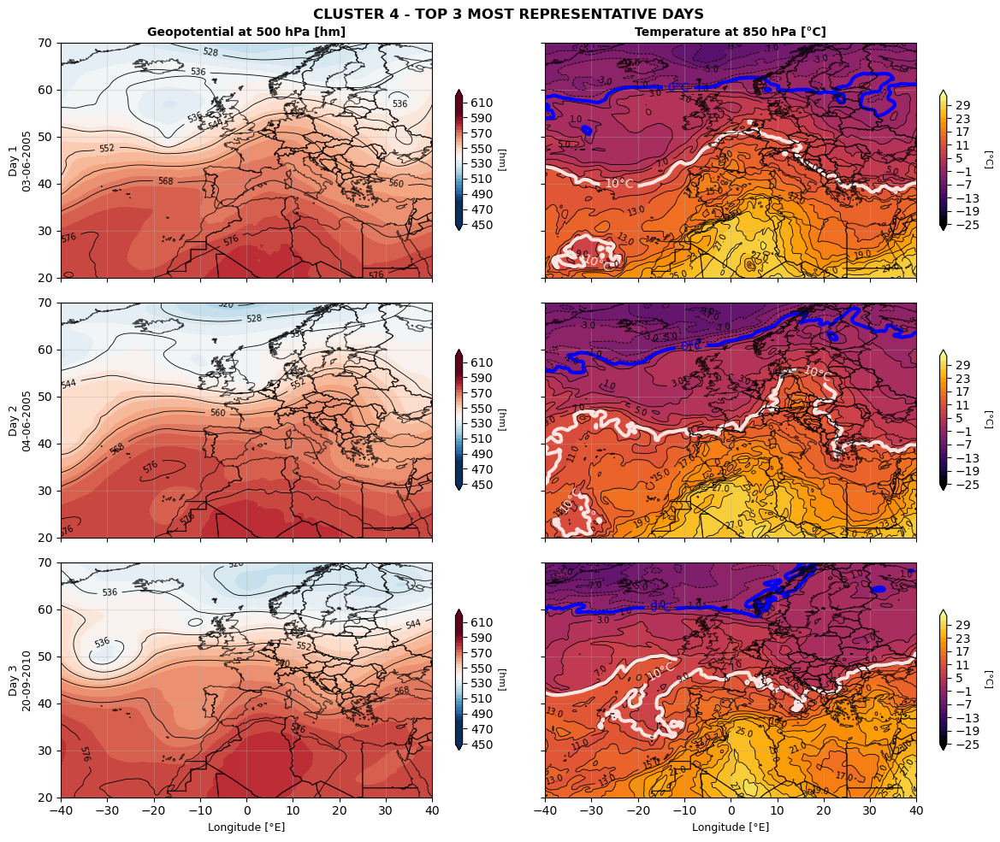

CLUSTER 5 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 12-04-2013 (Friday) - Rappresentatività: 48.9%
  2. 10-04-2013 (Wednesday) - Rappresentatività: 48.8%
  3. 11-04-2013 (Thursday) - Rappresentatività: 45.8%


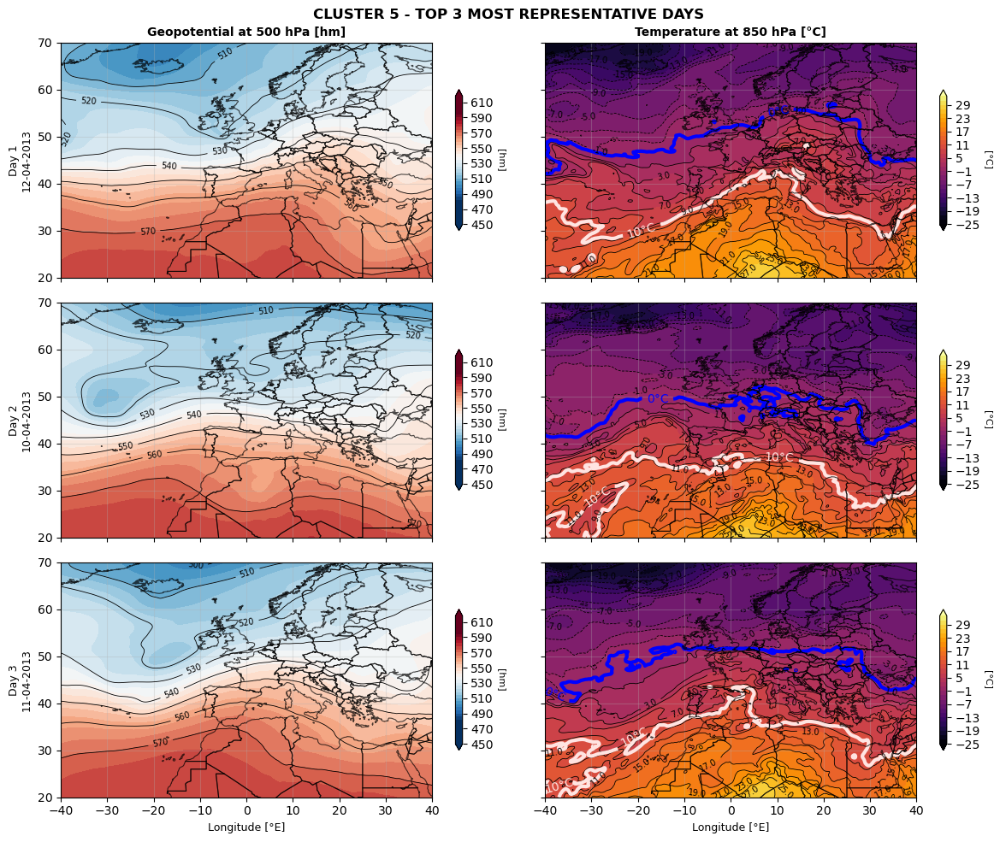

In [18]:
def analyze_representative_days(cluster_patterns, final_labels, final_centroids, X_pca, ds_filtered):
    """
    Analizza i 3 giorni più rappresentativi di ogni cluster
    """
    representative_days = {}
    
    print("TOP 3 GIORNI PIÙ RAPPRESENTATIVI PER CLUSTER")
    
    for cluster_id in range(len(final_centroids)):
        # Trova i 3 giorni più rappresentativi
        day_indices, distances = find_most_representative_days(
            cluster_id, final_labels, final_centroids, X_pca, n_days=3)
        
        # Estrai le date
        dates = pd.to_datetime(ds_filtered.time.values)
        representative_dates = dates[day_indices]
        
        # Calcola statistiche del cluster
        cluster_mask = final_labels == cluster_id
        cluster_size = np.sum(cluster_mask)
        all_distances = np.linalg.norm(X_pca[cluster_mask] - final_centroids[cluster_id], axis=1)
        mean_distance = np.mean(all_distances)
        
        # Calcola rappresentatività per ogni giorno
        representativities = [(1 - dist/mean_distance)*100 for dist in distances]
        
        representative_days[cluster_id] = {
            'day_indices': day_indices,  
            'dates': representative_dates,  
            'distances': distances,
            'cluster_size': cluster_size,
            'mean_distance_in_cluster': mean_distance,
            'representativities': representativities
        }
        
        print(f"\nCluster {cluster_id} ({cluster_size} giorni):")
        for i, (date, dist, repr_val) in enumerate(zip(representative_dates, distances, representativities)):
            print(f"  {i+1}. {date.strftime('%Y-%m-%d')} - Distanza: {dist:.3f} - Rappresentatività: {repr_val:.1f}%")
    
    return representative_days

def plot_real_meteorological_maps(representative_days, ds_filtered, sf=None):
    """
    Visualizza le mappe meteorologiche dei 3 giorni reali più rappresentativi per ogni cluster
    """

    # Fixed levels for geopotential
    z_levels_fixed = np.arange(450, 620, 4)  
    z_vmin, z_vmax = 480, 595

    # Fixed levels for temperature
    t_levels_fixed = np.arange(-25, 35, 2)  
    t_vmin, t_vmax = -25, 35
    
    for cluster_id, day_info in representative_days.items():
        day_indices = day_info['day_indices']  
        dates = day_info['dates']  
        distances = day_info['distances']
        representativities = day_info['representativities']
        
        print(f"CLUSTER {cluster_id} - TOP 3 GIORNI PIÙ RAPPRESENTATIVI")
        for i, (date, repr_val) in enumerate(zip(dates, representativities)):
            print(f"  {i+1}. {date.strftime('%d-%m-%Y (%A)')} - Rappresentatività: {repr_val:.1f}%")

        # Crea una figura con 3 righe (giorni) e 2 colonne (z, t)
        fig, axes = plt.subplots(3, 2, figsize=(12, 10))
        lon_grid, lat_grid = np.meshgrid(lons, lats)
        
        for day_idx, (day_index, date, distance, representativity) in enumerate(
            zip(day_indices, dates, distances, representativities)): 
            
            # Estrai i dati per quel giorno
            if 'z' in ds_filtered.data_vars:
                z_data = ds_filtered['z'].isel(time=day_index)
                # Gestisci dimensioni
                if 'pressure_z' in z_data.dims:
                    z_data = z_data.isel(pressure_z=0)
                
            if 't' in ds_filtered.data_vars:
                t_data = ds_filtered['t'].isel(time=day_index)
                # Gestisci dimensioni
                if 'pressure_t' in t_data.dims:
                    t_data = t_data.isel(pressure_t=0)
            
            # PLOT GEOPOTENZIALE (colonna 0)
            if 'z' in ds_filtered.data_vars:
                ax = axes[day_idx, 0]
                
                # Griglia lat/lon
                lons_grid, lats_grid = np.meshgrid(z_data.longitude, z_data.latitude)
                
                # Conversione metri → decametri
                data_hm = z_data.values / 100
                
                # Contour plot
                contour_filled = ax.contourf(lons_grid, lats_grid, data_hm, 
                                           levels=z_levels_fixed , cmap='RdBu_r', extend='both', vmin=z_vmin, vmax=z_vmax)
                contour_lines = ax.contour(lons_grid, lats_grid, data_hm, 
                                         z_levels_fixed = z_levels_fixed, colors='black', linewidths=0.6)
                ax.clabel(contour_lines, inline=True, fontsize=7, fmt='%.0f')

                
                
                # Confini europei
                if sf is not None:
                    add_country_boundaries(ax, sf)
                
                # Styling
                if day_idx == 0:
                    ax.set_title('Geopotential at 500 hPa [hm]', fontsize=10, fontweight='bold')
                ax.set_ylabel(f'Day {day_idx+1}\n{date.strftime("%d-%m-%Y")}', fontsize=9)
                ax.set_xlim([z_data.longitude.min(), z_data.longitude.max()])
                ax.set_ylim([z_data.latitude.min(), z_data.latitude.max()])
                ax.grid(True, alpha=0.3)
                
                # Rimuovi etichette x tranne ultima riga
                if day_idx < 2:
                    ax.set_xticklabels([])
                else:
                    ax.set_xlabel('Longitude [°E]', fontsize=9)
                
                # Colorbar solo per la prima riga
                cbar = plt.colorbar(contour_filled, ax=ax, shrink=0.6)
                cbar.set_label('[hm]', rotation=270, labelpad=10, fontsize=8)
            
            # PLOT TEMPERATURA (colonna 1)
            if 't' in ds_filtered.data_vars:
                ax = axes[day_idx, 1]
                
                # Griglia lat/lon
                lons_grid, lats_grid = np.meshgrid(t_data.longitude, t_data.latitude)
                
                # Conversione Kelvin → Celsius
                data_celsius = t_data.values - 273.15
                
                # Contour plot
                contour_filled = ax.contourf(lons_grid, lats_grid, data_celsius, 
                                           levels=t_levels_fixed, cmap='inferno', extend='both', vmin=t_vmin, vmax=t_vmax)
                contour_lines = ax.contour(lons_grid, lats_grid, data_celsius, 
                                         levels=t_levels_fixed, colors='black', linewidths=0.6)
                ax.clabel(contour_lines, inline=True, fontsize=7, fmt='%.1f')

                zero_contour = ax.contour(lon_grid, lat_grid, data_celsius, 
                                 levels=[0], colors='blue', 
                                 linewidths=3, linestyles='-')
                ax.clabel(zero_contour, inline=True, fontsize=10, fmt='0°C', colors='blue')

                ten_contour = ax.contour(lon_grid, lat_grid, data_celsius, 
                                 levels=[10], colors='mistyrose', 
                                 linewidths=3, linestyles='-')
                ax.clabel(ten_contour, inline=True, fontsize=10, fmt='10°C', colors='mistyrose')
                
                # Confini europei
                if sf is not None:
                    add_country_boundaries(ax, sf)
                
                # Styling
                if day_idx == 0:
                    ax.set_title('Temperature at 850 hPa [°C]', fontsize=10, fontweight='bold')
                ax.set_xlim([t_data.longitude.min(), t_data.longitude.max()])
                ax.set_ylim([t_data.latitude.min(), t_data.latitude.max()])
                ax.grid(True, alpha=0.3)
                
                # Rimuovi etichette x tranne ultima riga
                if day_idx < 2:
                    ax.set_xticklabels([])
                else:
                    ax.set_xlabel('Longitude [°E]', fontsize=9)
                
                # Rimuovi etichette y per colonna destra
                ax.set_yticklabels([])
                
                # Colorbar 
                cbar = plt.colorbar(contour_filled, ax=ax, shrink=0.6)
                cbar.set_label('[°C]', rotation=270, labelpad=10, fontsize=8)
        
        # Titolo generale
        fig.suptitle(f'CLUSTER {cluster_id} - TOP 3 MOST REPRESENTATIVE DAYS', 
                    fontsize=12, fontweight='bold', y=0.98)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.94)
        plt.show()

#   ESECUZIONE CORRETTA
print("ANALISI DEI TOP 3 GIORNI PIÙ RAPPRESENTATIVI")
representative_days = analyze_representative_days(cluster_patterns, final_labels, final_centroids, X_pca, ds_filtered)

print("_ _ _ _ _ _ _ _ _")
print("\nVISUALIZZAZIONE MAPPE DEI GIORNI RAPPRESENTATIVI")
plot_real_meteorological_maps(representative_days, ds_filtered, sf)

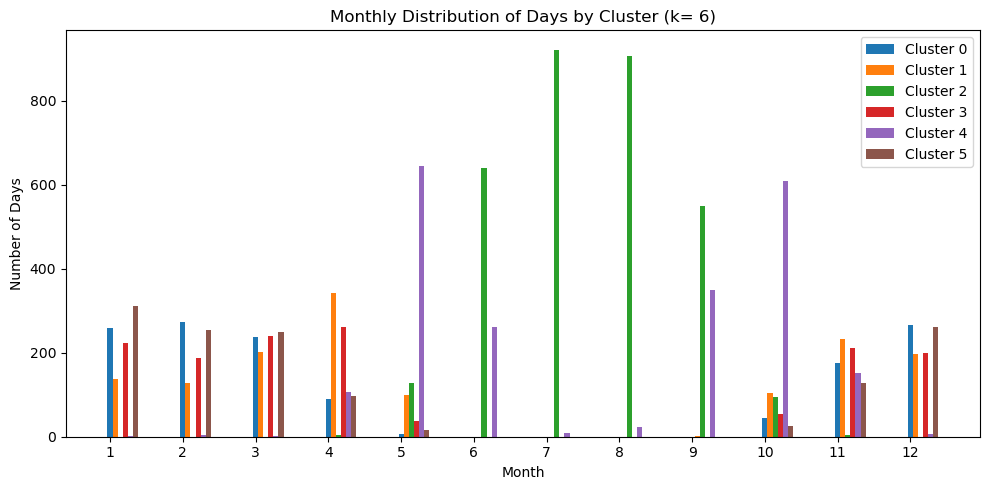

In [19]:
n_clusters = k_final

dates = pd.to_datetime(ds_filtered.time.values)
df_temporal = pd.DataFrame({
    'date': dates,
    'cluster': final_labels,  
    'month': dates.month,
    'year': dates.year
})

fig, ax = plt.subplots(figsize=(10, 5))
for cluster_id in range(n_clusters):
    monthly_counts = df_temporal[df_temporal['cluster'] == cluster_id]['month'].value_counts().sort_index()
    ax.bar(monthly_counts.index + cluster_id*0.07, monthly_counts.values, width=0.07, label=f'Cluster {cluster_id}')

ax.set_xticks(range(1, 13))
ax.set_xlabel('Month')
ax.set_ylabel('Number of Days')
ax.set_title(f'Monthly Distribution of Days by Cluster (k= {n_clusters})')
ax.legend()
plt.tight_layout()
plt.show()

In [20]:
# Carica le etichette salvate dai file CSV
labels_6 = pd.read_csv("/home/eugenia/Arpav/progetto/RES_k_era5_2004_2013/labels_k6.csv", header=None).squeeze("columns")
labels_11 = pd.read_csv("/home/eugenia/Arpav/progetto/RES_k_era5_2004_2013/labels_k11.csv", header=None).squeeze("columns")

# Verifica che abbiano la stessa lunghezzaù
print(f"labels_6 shape: {labels_6.shape}")
print(f"labels_11 shape: {labels_11.shape}")

labels_6 shape: (10957,)
labels_11 shape: (10957,)


Contingency table (rows: cluster k=6, columns: cluster k=11):
Contingency table (rows: cluster k=6, columns: cluster k=10):


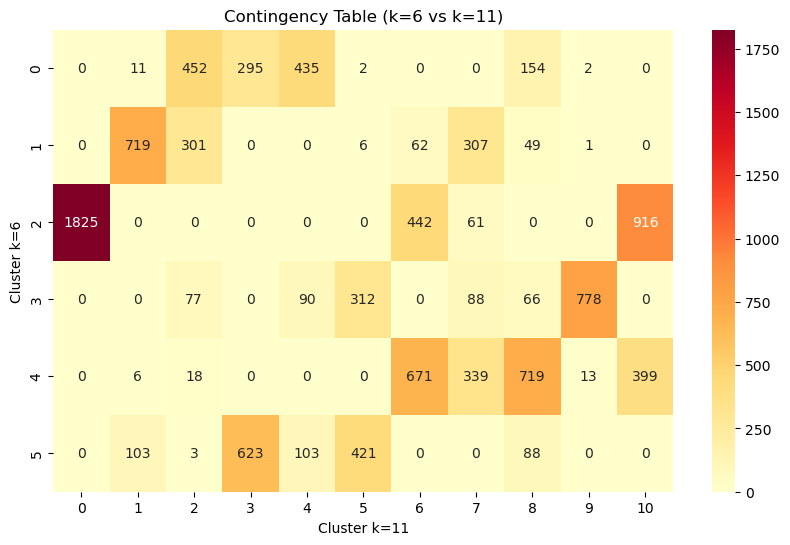

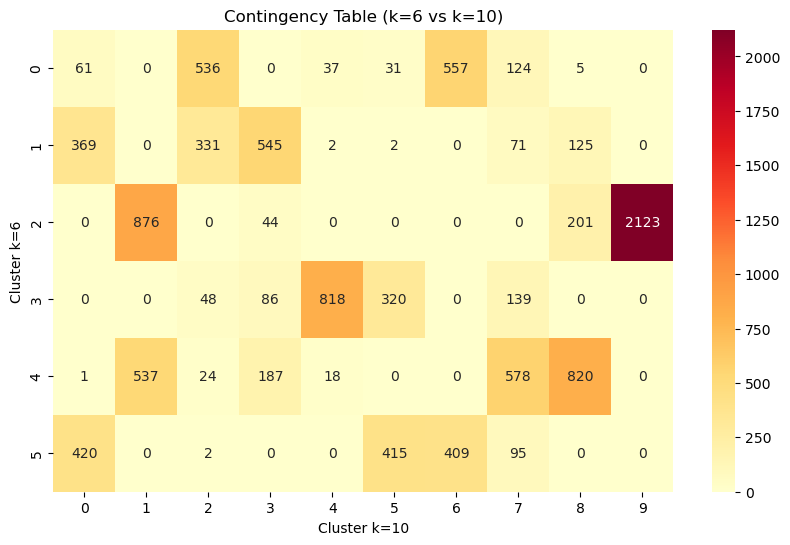

In [21]:
# Carica le etichette salvate dai file CSV
labels_6 = pd.read_csv("/home/eugenia/Arpav/progetto/RES_k_era5_2004_2013/labels_k6.csv", header=None).squeeze("columns")
labels_10 = pd.read_csv("/home/eugenia/Arpav/progetto/RES_k_era5_2004_2013/labels_k10.csv", header=None).squeeze("columns")
labels_11 = pd.read_csv("/home/eugenia/Arpav/progetto/RES_k_era5_2004_2013/labels_k11.csv", header=None).squeeze("columns")

# Crea la tabella di contingenza
contingency_6_11 = pd.crosstab(labels_6, labels_11)
print("Contingency table (rows: cluster k=6, columns: cluster k=11):")
#print(contingency_6_11)

contingency_6_10 = pd.crosstab(labels_6, labels_10)
print("Contingency table (rows: cluster k=6, columns: cluster k=10):")
#print(contingency_6_10)

plt.figure(figsize=(10, 6))
sns.heatmap(contingency_6_11, annot=True, fmt="d", cmap="YlOrRd")
plt.title("Contingency Table (k=6 vs k=11)")
plt.xlabel("Cluster k=11")
plt.ylabel("Cluster k=6")
plt.show()

plt.figure(figsize=(10, 6))
sns.heatmap(contingency_6_10, annot=True, fmt="d", cmap="YlOrRd")
plt.title("Contingency Table (k=6 vs k=10)")
plt.xlabel("Cluster k=10")
plt.ylabel("Cluster k=6")
plt.show()